In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import json
sns.set()

In [2]:
import matplotlib
from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="malgun.ttf").get_name()
    rc('font', family=font_name)
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

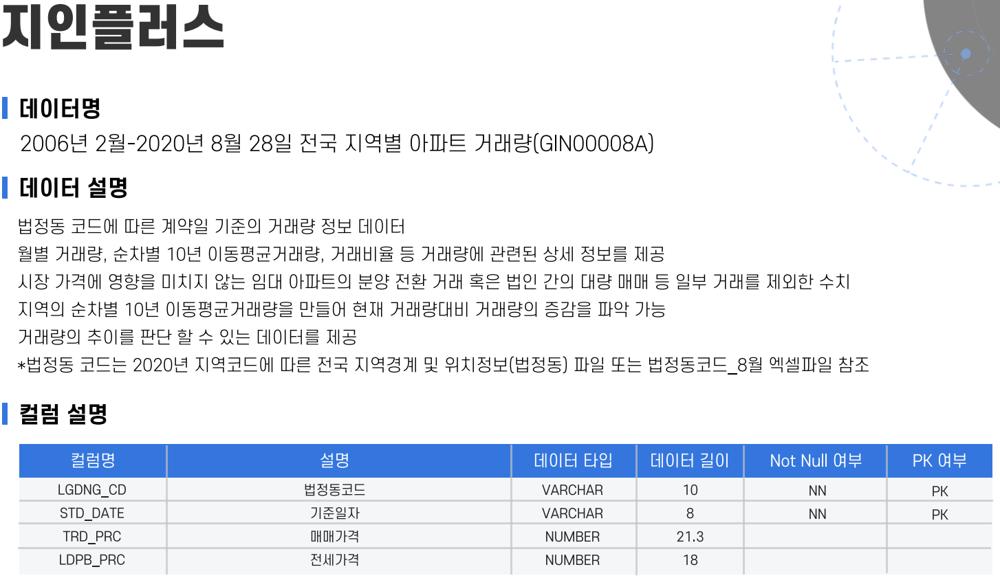

In [3]:
apt_amountdiet={'lgdng_cd':'법정동코드','std_date':'기준일자','trd_prc':'매매가격','ldpb_prc':'전세가격'}
apt_amount = pd.read_csv("./sample/GIN00009A.csv",parse_dates=['std_date'])
apt_amount=apt_amount.rename(columns=apt_amountdiet)
apt_amount

,법정동코드,기준일자,매매가격,전세가격
0,1100000000,2006-01-21,1289.0,NaN
1,1100000000,2006-02-21,1271.0,NaN
2,1100000000,2006-03-21,1291.0,NaN
3,1100000000,2006-04-21,1307.0,NaN
4,1100000000,2006-05-21,1321.0,NaN
...,...,...,...,...
785800,5013025900,2020-07-11,587.0,355.0
785801,5013025900,2020-07-21,587.0,355.0
785802,5013025900,2020-08-01,587.0,355.0
785803,5013025900,2020-08-11,587.0,355.0


In [4]:
#날짜 수정
apt_amount['년']=apt_amount['기준일자'].dt.year
apt_amount['월']=apt_amount['기준일자'].dt.month
apt_amount['일']=apt_amount['기준일자'].dt.day
apt_amount=apt_amount.drop(['기준일자'],axis=1)

In [5]:
apt_amount=apt_amount[apt_amount['일']==21] #기준일은 21일로 정함
apt_amount=apt_amount.drop(['일'],axis=1)
apt_amount

,법정동코드,매매가격,전세가격,년,월
0,1100000000,1289.0,NaN,2006,1
1,1100000000,1271.0,NaN,2006,2
2,1100000000,1291.0,NaN,2006,3
3,1100000000,1307.0,NaN,2006,4
4,1100000000,1321.0,NaN,2006,5
...,...,...,...,...,...
785792,5013025900,581.0,355.0,2020,4
785795,5013025900,581.0,355.0,2020,5
785798,5013025900,581.0,355.0,2020,6
785801,5013025900,587.0,355.0,2020,7


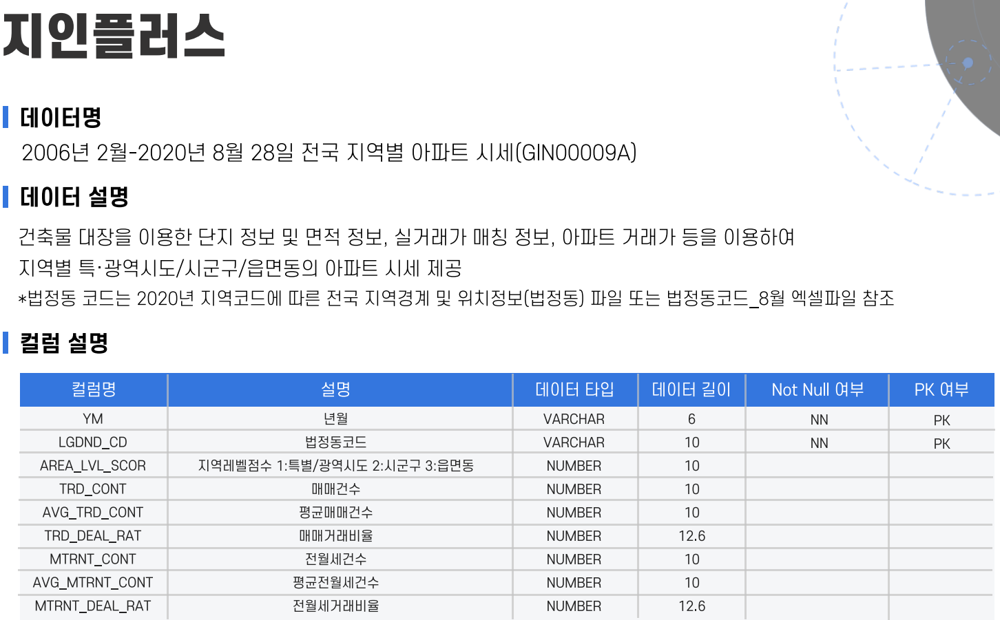

In [6]:
apt_pricediet={'ym':'년월','area_lvl_scor':'지역레벨점수','lgdng_cd':'법정동코드','trd_cont':'매매건수','avg_trd_cont':'평균매매건수','trd_deal_rat':'매매거래비율','mtrnt_cont':'전월세건수','avg_mtrnt_cont':'평균전월세건수','mtrnt_deal_rat':'전월세거래비율'}
apt_price = pd.read_csv("./sample/GIN00008A.csv",parse_dates=['ym'])
apt_price=apt_price.rename(columns=apt_pricediet)
apt_price

,년월,지역레벨점수,법정동코드,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율
0,200601,0,0,23357,0,NaN,0,0,NaN
1,200602,0,0,38617,0,NaN,0,0,NaN
2,200603,0,0,52241,0,NaN,0,0,NaN
3,200604,0,0,44253,0,NaN,0,0,NaN
4,200605,0,0,41916,0,NaN,0,0,NaN
...,...,...,...,...,...,...,...,...,...
937899,202004,3,5013032000,1,1,100.0,1,2,50.0
937900,202005,3,5013032000,1,1,100.0,0,0,NaN
937901,202006,3,5013032000,4,0,NaN,0,0,NaN
937902,202007,3,5013032000,2,1,200.0,1,0,NaN


In [7]:
# area_lvl_scor 지역점수 [1,2,3]으로 되어 있다 0은 제외
print(apt_price['지역레벨점수'].unique())
apt_price=apt_price[apt_price['지역레벨점수']!=0]

[0 1 2 3]


In [8]:
#날짜 수정
apt_price['년']=apt_price['년월'].apply(lambda x : int(x[0:4]) )
apt_price['월']=apt_price['년월'].apply(lambda x : int(x[4:6]) )

In [9]:
apt_price

,년월,지역레벨점수,법정동코드,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,년,월
176,200601,1,1100000000,5753,0,NaN,0,0,NaN,2006,1
177,200602,1,1100000000,7912,0,NaN,0,0,NaN,2006,2
178,200603,1,1100000000,11943,0,NaN,0,0,NaN,2006,3
179,200604,1,1100000000,9391,0,NaN,0,0,NaN,2006,4
180,200605,1,1100000000,8188,0,NaN,0,0,NaN,2006,5
...,...,...,...,...,...,...,...,...,...,...,...
937899,202004,3,5013032000,1,1,100.0,1,2,50.0,2020,4
937900,202005,3,5013032000,1,1,100.0,0,0,NaN,2020,5
937901,202006,3,5013032000,4,0,NaN,0,0,NaN,2020,6
937902,202007,3,5013032000,2,1,200.0,1,0,NaN,2020,7


In [10]:
apts=apt_amount.merge(apt_price)

In [11]:
apts['법정동코드']=apts['법정동코드'].astype('category')
apts['지역레벨점수']=apts['지역레벨점수'].astype('category')

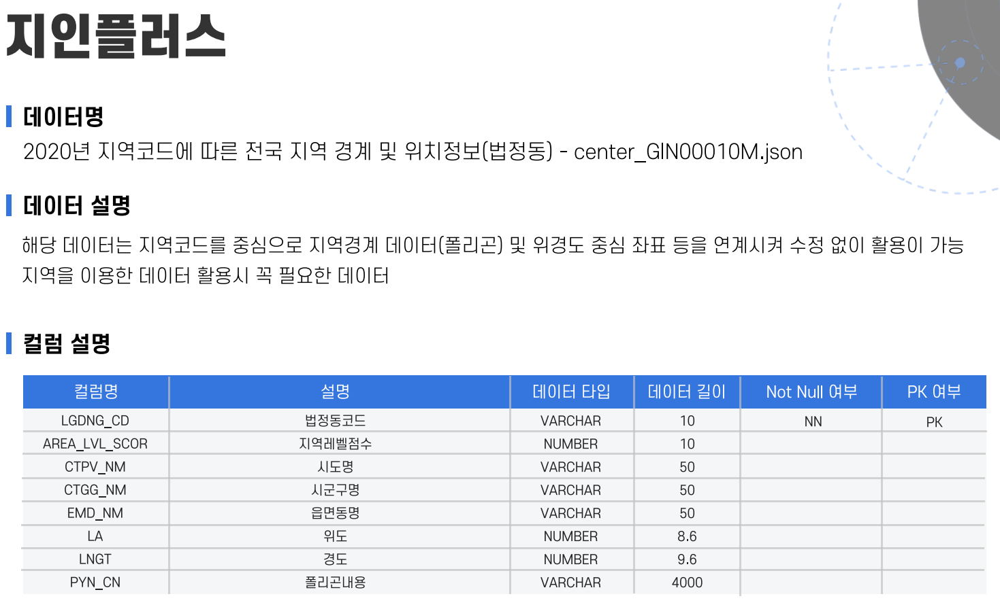

In [12]:
regiondiet={'AREA_LVL_SCOR':'지역레벨점수','LGDNG_CD':'법정동코드','CTPV_NM':'시도명','CTGG_NM':'시군구명','EMD_NM':'읍면동명','LA':'위도','LNGT':'경도','PYN_CN':'폴리곤내용'}
region = pd.read_json("./sample/center_GIN00010M.json")
region=region.rename(columns=regiondiet)
region

,지역레벨점수,법정동코드,시도명,시군구명,읍면동명,위도,경도,폴리곤내용
0,1,1100000000,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
1,2,1111000000,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
2,3,1111010100,서울특별시,종로구,청운동,37.589197,126.969329,"{""type"":""Polygon"",""coordinates"":[[[126.9614,37..."
3,3,1111010200,서울특별시,종로구,신교동,37.584490,126.967923,"{""type"":""Polygon"",""coordinates"":[[[126.965,37...."
4,3,1111010300,서울특별시,종로구,궁정동,37.584682,126.973144,"{""type"":""Polygon"",""coordinates"":[[[126.974,37...."
...,...,...,...,...,...,...,...,...
20567,4,5013032022,제주특별자치도,서귀포시,표선면 하천리,NaN,NaN,None
20568,4,5013032023,제주특별자치도,서귀포시,표선면 성읍리,NaN,NaN,None
20569,4,5013032024,제주특별자치도,서귀포시,표선면 가시리,NaN,NaN,None
20570,4,5013032025,제주특별자치도,서귀포시,표선면 세화리,NaN,NaN,None


In [73]:
# reg = pd.read_json("./sample/center_GIN00010M.json")

In [74]:
# temp=[]
# for i in reg.index:
#     features={}
#     features["type"]="Feature"
#     features["properties"]={"AREA_LVL_SCOR":reg["AREA_LVL_SCOR"][i],"LGDNG_CD":reg["LGDNG_CD"][i],"CTPV_NM":reg["CTPV_NM"][i],"CTGG_NM":reg["CTGG_NM"][i],"EMD_NM":reg["EMD_NM"][i],"LA":reg["LA"][i],"LNGT":reg["LNGT"][i]}
#     features["geometry"]=reg["PYN_CN"][i]
#     temp.append(features)
# geo_data={
# "type": "FeatureCollection",
# "crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
# "features":temp}

In [76]:
# f=open('geo_data.txt','w')
# f.write(str(geo_data))
# f.close()

In [15]:
apts=apts.merge(region)

In [16]:
apts['전월세건수'][apts['전세가격'].isnull()]=np.nan
apts['평균전월세건수'][apts['전월세거래비율'].isnull()]=np.nan

In [17]:
apts['년월']=apts['년월'].astype('int64')
apts=apts[apts['년월']>201012]

In [18]:
a1=apts[apts['지역레벨점수']==1]
a1

,법정동코드,매매가격,전세가격,년,월,년월,지역레벨점수,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,시도명,시군구명,읍면동명,위도,경도,폴리곤내용
60,1100000000,1627.0,805.0,2011,1,201101,1,6999,5340,131.07,14845.0,NaN,NaN,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
61,1100000000,1631.0,801.0,2011,2,201102,1,5939,5903,100.61,14970.0,NaN,NaN,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
62,1100000000,1631.0,804.0,2011,3,201103,1,5285,8165,64.73,14893.0,NaN,NaN,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
63,1100000000,1628.0,808.0,2011,4,201104,1,3979,7344,54.18,11962.0,NaN,NaN,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
64,1100000000,1625.0,814.0,2011,5,201105,1,3686,6122,60.21,11443.0,NaN,NaN,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396955,5000000000,1169.0,720.0,2020,4,202004,1,154,276,55.80,273.0,217.0,125.81,제주특별자치도,None,None,33.386383,126.548687,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
396956,5000000000,1170.0,721.0,2020,5,202005,1,190,235,80.85,222.0,152.0,146.05,제주특별자치도,None,None,33.386383,126.548687,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
396957,5000000000,1172.0,721.0,2020,6,202006,1,307,285,107.72,230.0,153.0,150.33,제주특별자치도,None,None,33.386383,126.548687,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
396958,5000000000,1191.0,726.0,2020,7,202007,1,288,241,119.50,213.0,152.0,140.13,제주특별자치도,None,None,33.386383,126.548687,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."


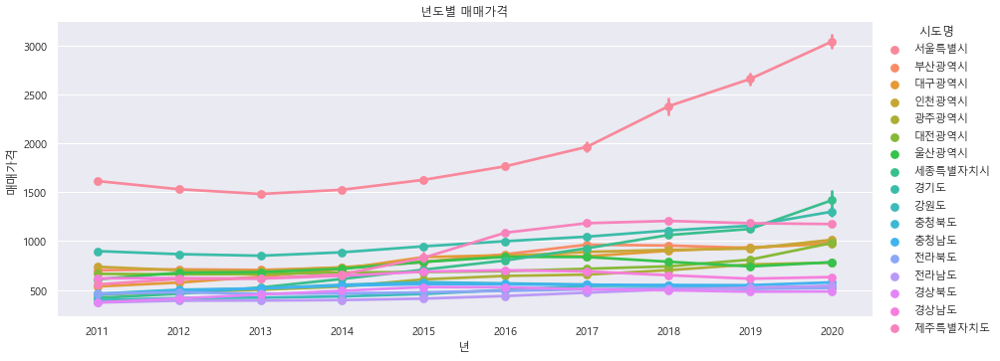

In [19]:
sns.factorplot(x='년',y='매매가격',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 매매가격')
plt.show()

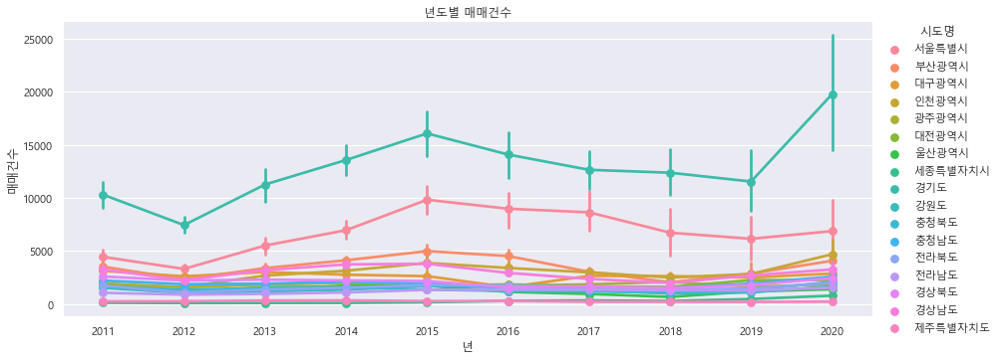

In [20]:
sns.factorplot(x='년',y='매매건수',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 매매건수')
plt.show()

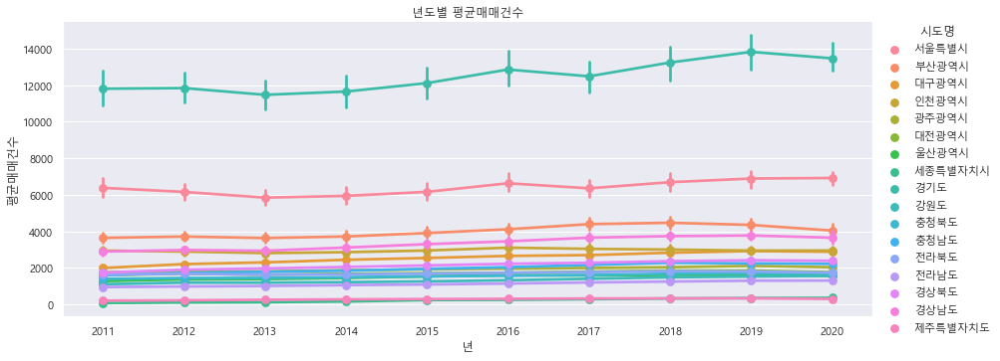

In [21]:
sns.factorplot(x='년',y='평균매매건수',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 평균매매건수')
plt.show()

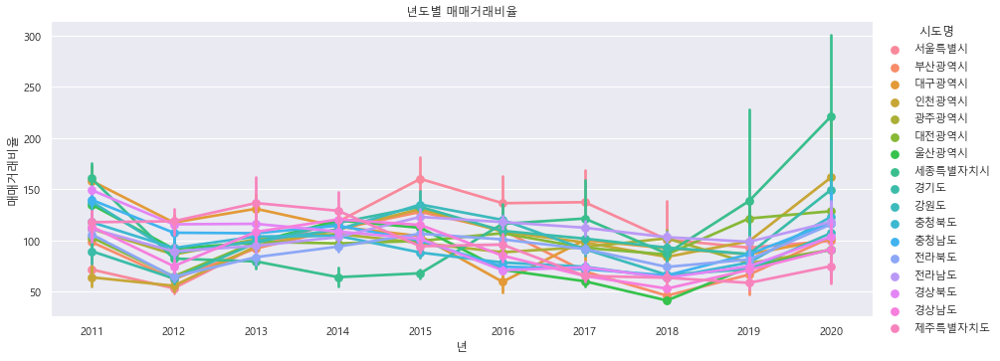

In [22]:
sns.factorplot(x='년',y='매매거래비율',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 매매거래비율')
plt.show()

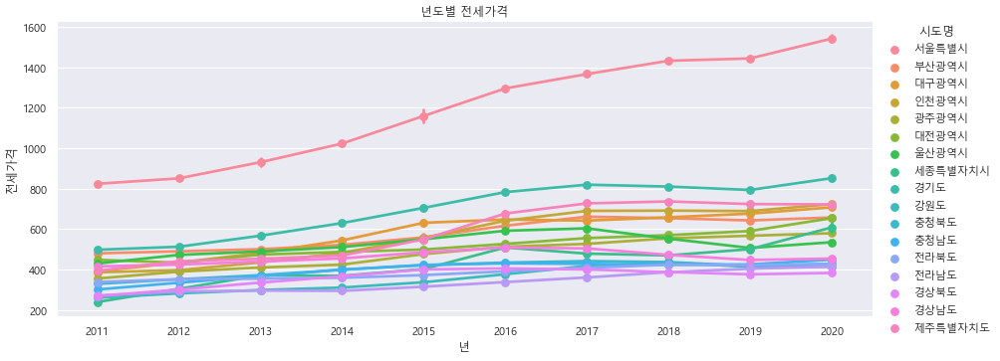

In [23]:
sns.factorplot(x='년',y='전세가격',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 전세가격')
plt.show()

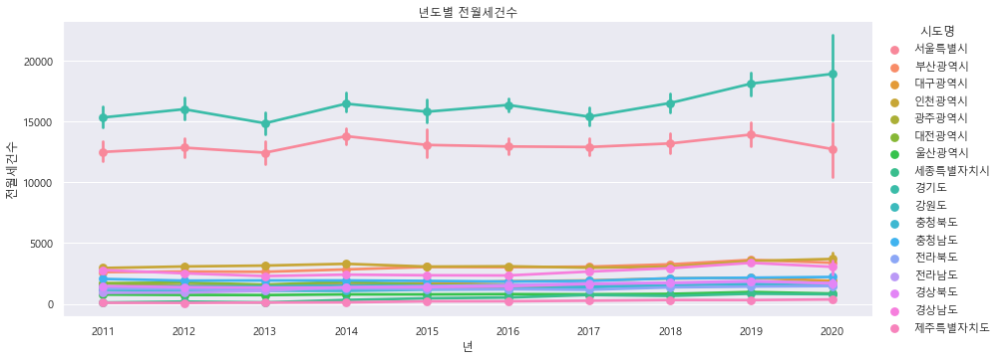

In [24]:
sns.factorplot(x='년',y='전월세건수',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 전월세건수')
plt.show()

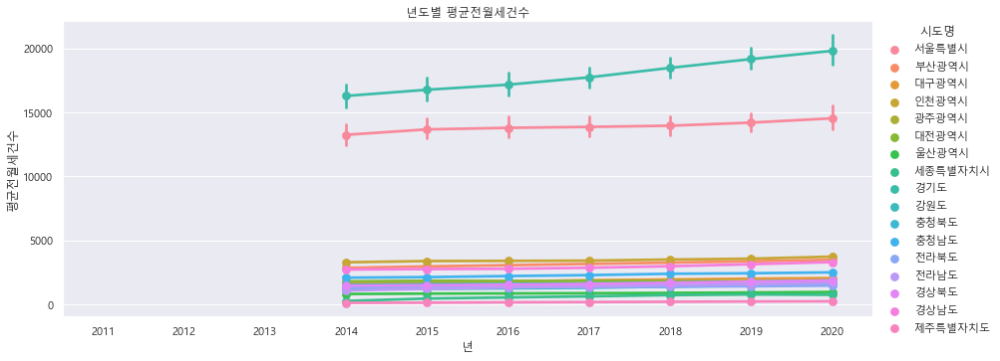

In [25]:
sns.factorplot(x='년',y='평균전월세건수',hue='시도명',aspect=2.5,data=a1)
plt.title('년도별 평균전월세건수')
plt.show()

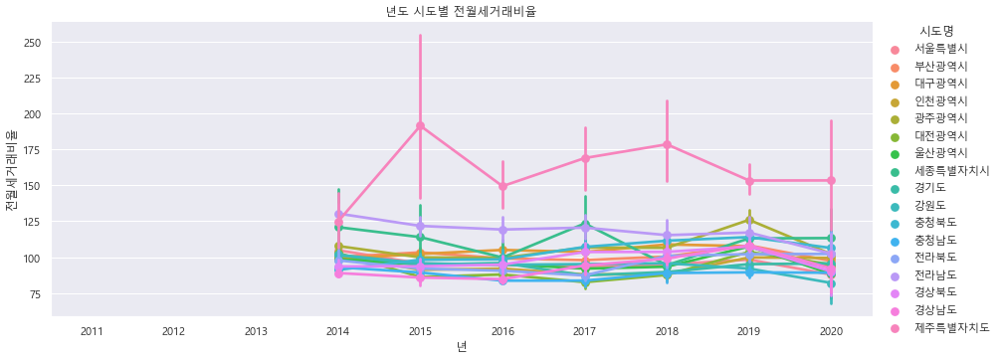

In [26]:
sns.factorplot(x='년',y='전월세거래비율',hue='시도명',aspect=2.5,data=a1)
plt.title('년도 시도별 전월세거래비율')
plt.show()

In [27]:
a1_2020=a1[a1['년월']==202002]
a1_2020
a1_2019=a1[a1['년월']==201902]
a1_2019

,법정동코드,매매가격,전세가격,년,월,년월,지역레벨점수,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,시도명,시군구명,읍면동명,위도,경도,폴리곤내용
157,1100000000,2588.0,1434.0,2019,2,201902,1,1450,6587,22.01,14443.0,16179.0,89.27,서울특별시,None,None,37.529343,126.951488,"{""type"": ""Polygon"", ""coordinates"": [[[126.9796..."
48866,2600000000,937.0,650.0,2019,2,201902,1,1644,3965,41.46,3938.0,3543.0,111.15,부산광역시,None,None,35.200289,129.063162,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
69447,2700000000,934.0,669.0,2019,2,201902,1,1667,2885,57.78,2203.0,2201.0,100.09,대구광역시,None,None,35.871380,128.601805,"{""type"": ""Polygon"", ""coordinates"": [[[128.6960..."
88825,2800000000,921.0,690.0,2019,2,201902,1,1846,2703,68.29,3626.0,3835.0,94.55,인천광역시,None,None,37.566548,126.416846,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
104142,2900000000,758.0,569.0,2019,2,201902,1,1405,2208,63.63,1601.0,1594.0,100.44,광주광역시,None,None,35.151419,126.835557,"{""type"": ""Polygon"", ""coordinates"": [[[126.7602..."
117438,3000000000,776.0,582.0,2019,2,201902,1,1273,1808,70.41,1854.0,2149.0,86.27,대전광역시,None,None,36.317378,127.416185,"{""type"": ""Polygon"", ""coordinates"": [[[127.3981..."
133087,3100000000,747.0,515.0,2019,2,201902,1,806,1578,51.08,984.0,940.0,104.68,울산광역시,None,None,35.572186,129.230066,"{""type"": ""Polygon"", ""coordinates"": [[[129.3463..."
142865,3600000000,1113.0,511.0,2019,2,201902,1,191,330,57.88,815.0,743.0,109.69,세종특별자치시,None,None,36.645918,127.240654,"{""type"": ""Polygon"", ""coordinates"": [[[127.1784..."
145008,4100000000,1153.0,797.0,2019,2,201902,1,5766,13076,44.10,16797.0,21453.0,78.30,경기도,None,None,37.238209,127.135507,"{""type"": ""MultiPolygon"", ""coordinates"": [[[[12..."
224227,4200000000,535.0,422.0,2019,2,201902,1,892,1501,59.43,1913.0,2121.0,90.19,강원도,None,None,37.791198,128.336831,"{""type"": ""Polygon"", ""coordinates"": [[[128.6426..."


In [28]:
center = [35.9, 127.986]
m = folium.plugins.DualMap(location=center,zoom_start=7)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2019,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '매매가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a1_2019[['위도','경도']].values,
                      popups = list(a1_2019[['시도명','매매가격']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2020,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '매매가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a1_2020[['위도','경도']].values,
                      popups = list(a1_2020[['시도명','매매가격']].values)).add_to(m.m2)
m

In [29]:
center = [35.9, 127.986]
m = folium.plugins.DualMap(location=center,zoom_start=7)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2019,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '매매건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a1_2019[['위도','경도']].values,
                      popups = list(a1_2019[['시도명','매매건수']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2020,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '매매건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a1_2020[['위도','경도']].values,
                      popups = list(a1_2020[['시도명','매매건수']].values)).add_to(m.m2)
m

In [30]:
center = [35.9, 127.986]
m = folium.plugins.DualMap(location=center,zoom_start=7)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2019,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '전세가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a1_2019[['위도','경도']].values,
                      popups = list(a1_2019[['시도명','전세가격']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2020,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '전세가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a1_2020[['위도','경도']].values,
                      popups = list(a1_2020[['시도명','전세가격']].values)).add_to(m.m2)
m

In [31]:
center = [35.9, 127.986]
m = folium.plugins.DualMap(location=center,zoom_start=7)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2019,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '전월세건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a1_2019[['위도','경도']].values,
                      popups = list(a1_2019[['시도명','전월세건수']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTPV.geojson',data=a1_2020,
                  key_on='feature.properties.CTPV_NM',columns=('시도명', '전월세건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a1_2020[['위도','경도']].values,
                      popups = list(a1_2020[['시도명','전월세건수']].values)).add_to(m.m2)
m


In [32]:
a2=apts[(apts['지역레벨점수']==2) & (apts['시도명']=='서울특별시')]
a2

,법정동코드,매매가격,전세가격,년,월,년월,지역레벨점수,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,시도명,시군구명,읍면동명,위도,경도,폴리곤내용
236,1111000000,1564.0,877.0,2011,1,201101,2,51,34,150.00,128.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
237,1111000000,1568.0,863.0,2011,2,201102,2,48,47,102.13,102.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
238,1111000000,1566.0,878.0,2011,3,201103,2,68,62,109.68,84.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
239,1111000000,1555.0,872.0,2011,4,201104,2,30,56,53.57,83.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
240,1111000000,1549.0,880.0,2011,5,201105,2,31,51,60.78,65.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47158,1174000000,2957.0,1441.0,2020,4,202004,2,123,371,33.15,716.0,801.0,89.39,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633..."
47159,1174000000,2972.0,1456.0,2020,5,202005,2,285,424,67.22,625.0,901.0,69.37,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633..."
47160,1174000000,3037.0,1484.0,2020,6,202006,2,848,378,224.34,568.0,899.0,63.18,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633..."
47161,1174000000,3149.0,1542.0,2020,7,202007,2,546,442,123.53,468.0,809.0,57.85,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633..."


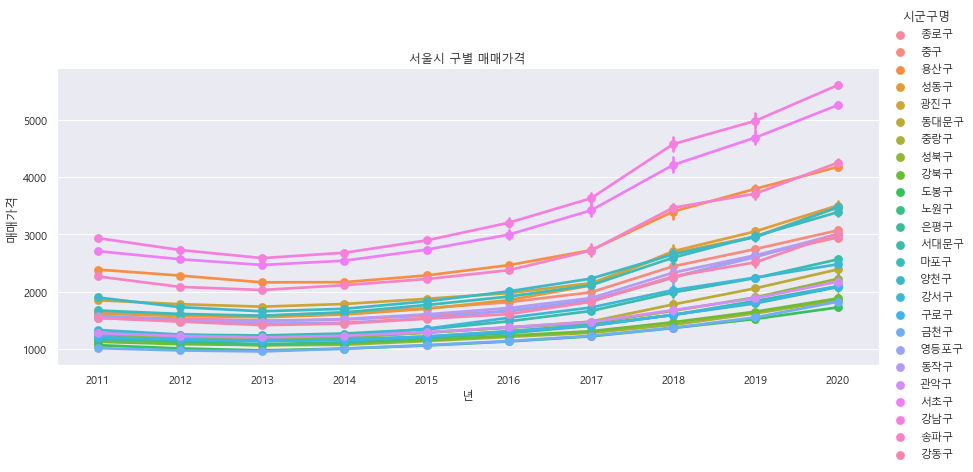

In [33]:
sns.factorplot(x='년',y='매매가격',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 매매가격')
plt.show()

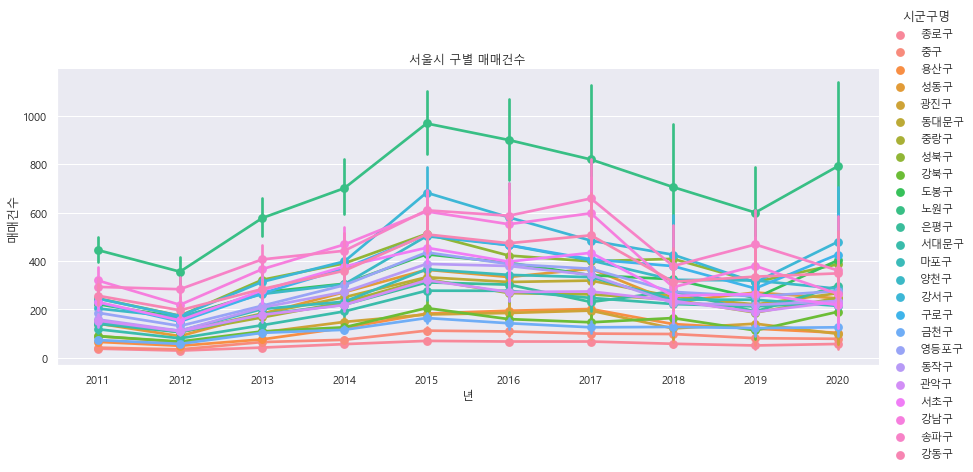

In [34]:
sns.factorplot(x='년',y='매매건수',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 매매건수')
plt.show()

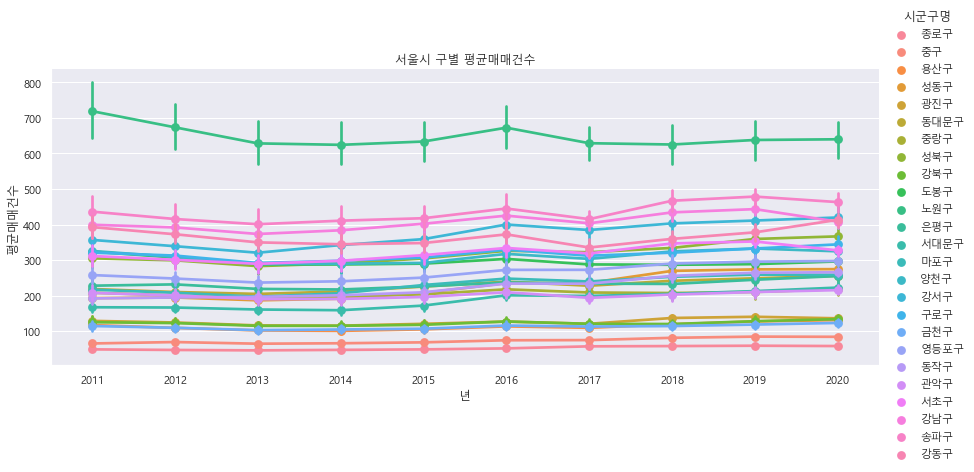

In [35]:
sns.factorplot(x='년',y='평균매매건수',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 평균매매건수')
plt.show()

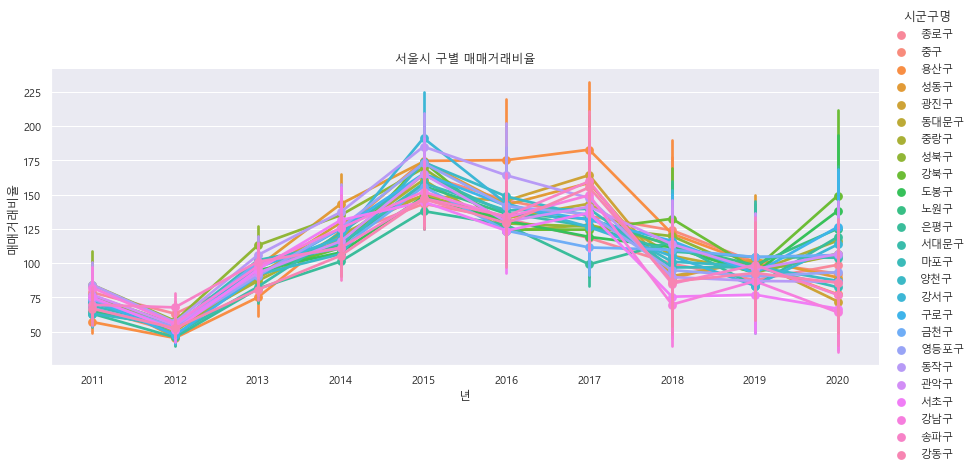

In [36]:
sns.factorplot(x='년',y='매매거래비율',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 매매거래비율')
plt.show()

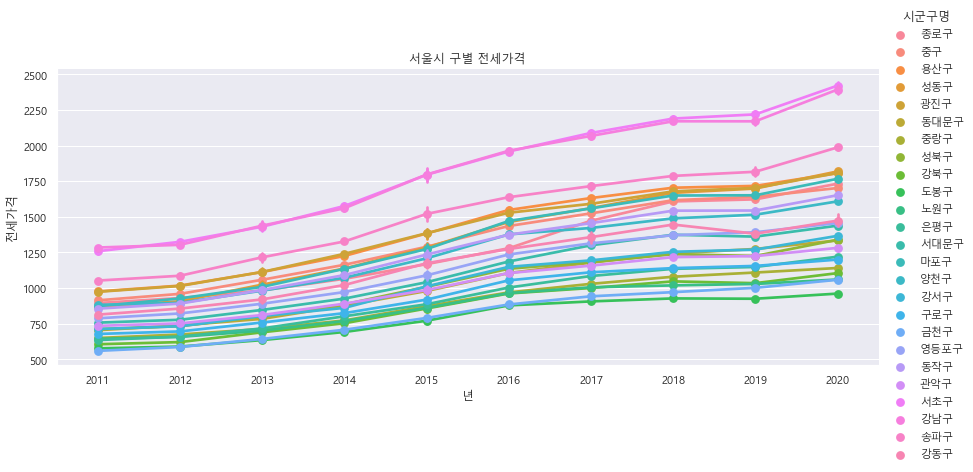

In [37]:
sns.factorplot(x='년',y='전세가격',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 전세가격')
plt.show()

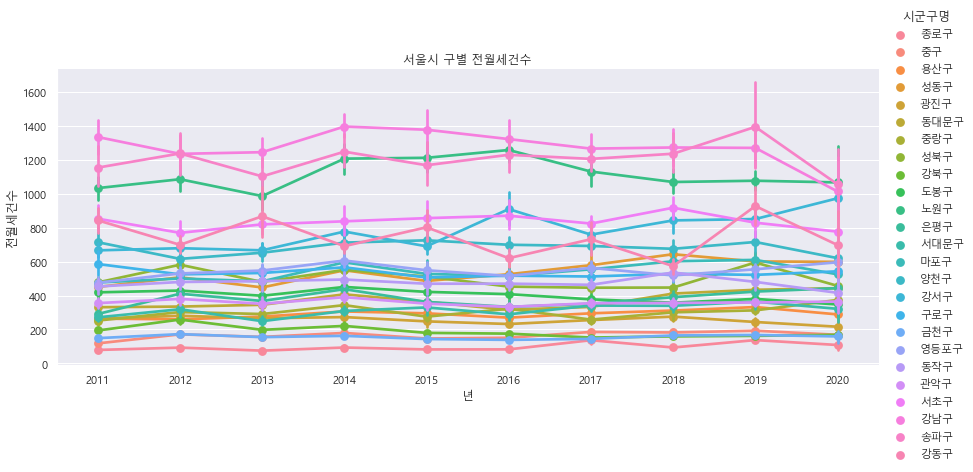

In [38]:
sns.factorplot(x='년',y='전월세건수',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 전월세건수')
plt.show()

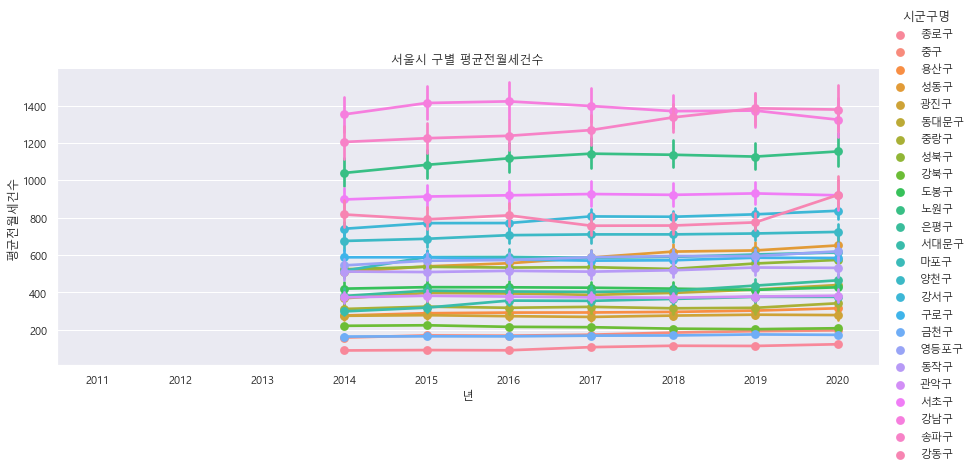

In [39]:
sns.factorplot(x='년',y='평균전월세건수',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 평균전월세건수')
plt.show()

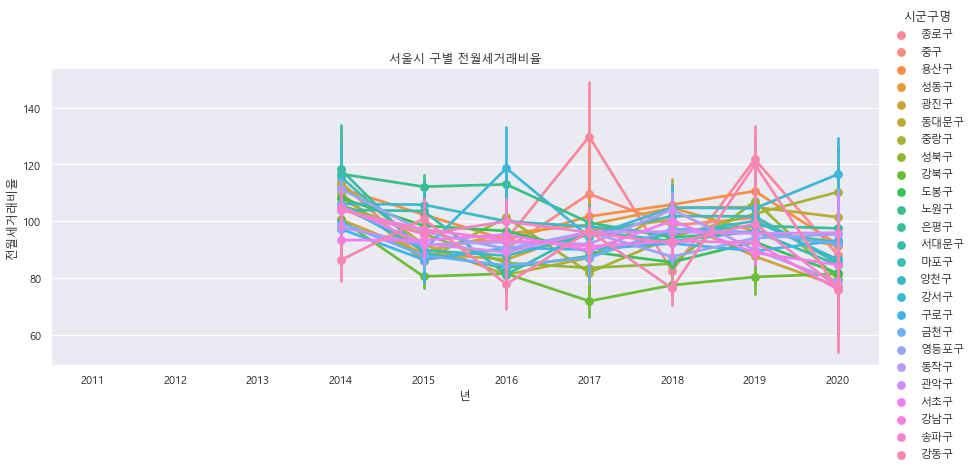

In [40]:
sns.factorplot(x='년',y='전월세거래비율',hue='시군구명',aspect=2.5,data=a2)
plt.title('서울시 구별 전월세거래비율')
plt.show()

In [41]:
a2_2020=a2[a2['년월']==202002]
a2_2020
a2_2019=a2[a2['년월']==201902]
a2_2019

,법정동코드,매매가격,전세가격,년,월,년월,지역레벨점수,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,시도명,시군구명,읍면동명,위도,경도,폴리곤내용
333,1111000000,2519.0,1629.0,2019,2,201902,2,16,61,26.23,156.0,138.0,113.04,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117..."
2150,1114000000,2662.0,1636.0,2019,2,201902,2,22,83,26.51,175.0,217.0,80.65,서울특별시,중구,None,37.560780,126.994567,"{""type"":""Polygon"",""coordinates"":[[[126.9966260..."
3862,1117000000,3705.0,1712.0,2019,2,201902,2,36,115,31.30,305.0,335.0,91.04,서울특별시,용산구,None,37.534686,126.981897,"{""type"":""Polygon"",""coordinates"":[[[126.9479084..."
7393,1120000000,2987.0,1681.0,2019,2,201902,2,27,251,10.76,729.0,717.0,101.67,서울특별시,성동구,None,37.553691,127.041918,"{""type"":""Polygon"",""coordinates"":[[[127.0565909..."
10380,1121500000,2861.0,1668.0,2019,2,201902,2,28,138,20.29,237.0,345.0,68.70,서울특별시,광진구,None,37.546622,127.084462,"{""type"":""Polygon"",""coordinates"":[[[127.1027064..."
11612,1123000000,2007.0,1273.0,2019,2,201902,2,67,247,27.13,428.0,464.0,92.24,서울특별시,동대문구,None,37.579512,127.045736,"{""type"":""Polygon"",""coordinates"":[[[127.0708560..."
13372,1126000000,1568.0,1107.0,2019,2,201902,2,62,205,30.24,257.0,389.0,66.07,서울특별시,중랑구,None,37.592316,127.090402,"{""type"":""Polygon"",""coordinates"":[[[127.0961949..."
14604,1129000000,1856.0,1227.0,2019,2,201902,2,80,358,22.35,677.0,612.0,110.62,서울특별시,성북구,None,37.599701,127.019386,"{""type"":""Polygon"",""coordinates"":[[[127.0193712..."
17944,1130500000,1638.0,1043.0,2019,2,201902,2,34,122,27.87,155.0,215.0,72.09,서울특별시,강북구,None,37.636751,127.005075,"{""type"":""Polygon"",""coordinates"":[[[127.0045266..."
18824,1132000000,1494.0,929.0,2019,2,201902,2,74,268,27.61,366.0,479.0,76.41,서울특별시,도봉구,None,37.665724,127.029105,"{""type"":""Polygon"",""coordinates"":[[[127.0440277..."


In [42]:
center = [37.541, 126.986]
m = folium.plugins.DualMap(location=center, zoom_start=11)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2019,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '매매가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a2_2019[['위도','경도']].values,
                      popups = list(a2_2019[['시군구명','매매가격']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2020,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '매매가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a2_2020[['위도','경도']].values,
                      popups = list(a2_2020[['시군구명','매매가격']].values)).add_to(m.m2)
m

In [43]:
center = [37.541, 126.986]
m = folium.plugins.DualMap(location=center, zoom_start=11)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2019,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '매매건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a2_2019[['위도','경도']].values,
                      popups = list(a2_2019[['시군구명','매매건수']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2020,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '매매건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a2_2020[['위도','경도']].values,
                      popups = list(a2_2020[['시군구명','매매건수']].values)).add_to(m.m2)
m

In [77]:
center = [37.541, 126.986]
m = folium.plugins.DualMap(location=center, zoom_start=11)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2019,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '전세가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a2_2019[['위도','경도']].values,
                      popups = list(a2_2019[['시군구명','전세가격']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2020,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '전세가격'),
                  fill_color='OrRd', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a2_2020[['위도','경도']].values,
                      popups = list(a2_2020[['시군구명','전세가격']].values)).add_to(m.m2)
m

JSONDecodeError: Expecting ',' delimiter: line 1 column 4476679 (char 4476678)

In [45]:
center = [37.541, 126.986]
m = folium.plugins.DualMap(location=center, zoom_start=11)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2019,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '전월세건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m1)
plugins.MarkerCluster(a2_2019[['위도','경도']].values,
                      popups = list(a2_2019[['시군구명','전월세건수']].values)).add_to(m.m1)
folium.Choropleth( geo_data='CTGG.geojson',data=a2_2020,
                  key_on='feature.properties.CTGG_NM',columns=('시군구명', '전월세건수'),
                  fill_color='BuGn', legend_name='년').add_to(m.m2)
plugins.MarkerCluster(a2_2020[['위도','경도']].values,
                      popups = list(a2_2020[['시군구명','전월세건수']].values)).add_to(m.m2)
m

In [ ]:
mylist=['매매가격']
for i in mylist:
    a2[i+'scale']=(a2[i]-a2[i].min())/(a2[i].max()-a2[i].min())
    
a2[['위도','경도']]+

In [65]:
center = [37.541, 126.986]
m = folium.Map(location=center,tiles='stamentoner', zoom_start=11)
hm = plugins.HeatMap(a2[['위도','경도']].values)
hm.add_to(m)
m

In [69]:
mylist=['매매가격']
for i in mylist:
    a2[i+'scale']=(a2[i]-a2[i].min())/(a2[i].max()-a2[i].min())
    
a2

,법정동코드,매매가격,전세가격,년,월,년월,지역레벨점수,매매건수,평균매매건수,매매거래비율,전월세건수,평균전월세건수,전월세거래비율,시도명,시군구명,읍면동명,위도,경도,폴리곤내용,매매가격scale
236,1111000000,1564.0,877.0,2011,1,201101,2,51,34,150.00,128.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117...",0.129300
237,1111000000,1568.0,863.0,2011,2,201102,2,48,47,102.13,102.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117...",0.130128
238,1111000000,1566.0,878.0,2011,3,201103,2,68,62,109.68,84.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117...",0.129714
239,1111000000,1555.0,872.0,2011,4,201104,2,30,56,53.57,83.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117...",0.127435
240,1111000000,1549.0,880.0,2011,5,201105,2,31,51,60.78,65.0,NaN,NaN,서울특별시,종로구,None,37.585862,126.977537,"{""type"": ""Polygon"", ""coordinates"": [[[127.0117...",0.126191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47158,1174000000,2957.0,1441.0,2020,4,202004,2,123,371,33.15,716.0,801.0,89.39,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633...",0.417944
47159,1174000000,2972.0,1456.0,2020,5,202005,2,285,424,67.22,625.0,901.0,69.37,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633...",0.421053
47160,1174000000,3037.0,1484.0,2020,6,202006,2,848,378,224.34,568.0,899.0,63.18,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633...",0.434521
47161,1174000000,3149.0,1542.0,2020,7,202007,2,546,442,123.53,468.0,809.0,57.85,서울특별시,강동구,None,37.550548,127.127651,"{""type"":""Polygon"",""coordinates"":[[[127.1349633...",0.457729


In [70]:
np.random.seed(3141592)
initial_data = ( np.random.normal(size=(100, 2)) * np.array([[1, 1]]) + np.array([[48, 5]]) )

move_data = np.random.normal(size=(100, 2)) * 0.01

data = [(initial_data + move_data * i).tolist() for i in range(100)]
weight = 1  

for time_entry in data: 
    for row in time_entry:
        row.append(weight)


In [72]:
data

[[[47.504539036025584, 4.292407029209247, 1],
  [47.69040904564529, 4.252424765823684, 1],
  [46.56622363785289, 3.1698932994737725, 1],
  [48.512345988527414, 3.5575115701151936, 1],
  [47.912356200438545, 4.541688488218782, 1],
  [47.7449114720645, 6.410987139161764, 1],
  [49.27575216702049, 3.583654594233588, 1],
  [47.82845322406549, 3.8219354061097293, 1],
  [48.04493261439567, 6.31593606743332, 1],
  [46.476548975848104, 4.6875193522227105, 1],
  [48.22998111187808, 4.330735827816389, 1],
  [49.09176755111292, 5.097273923224413, 1],
  [48.27319149417738, 5.658018973640203, 1],
  [48.122983644592075, 5.780950867261257, 1],
  [46.44643679370932, 4.755224680829496, 1],
  [49.29166945103235, 6.129019031044898, 1],
  [47.001037365055055, 6.290837811317019, 1],
  [46.8662712198302, 5.128384470003526, 1],
  [48.60872159648292, 4.685247191774352, 1],
  [48.847472424367105, 4.528416690851091, 1],
  [49.82969363846115, 3.7616826932379714, 1],
  [47.41209462975057, 5.286337622398916, 1],
 